In [1]:
from selenium import webdriver
driver = webdriver.Chrome("c:/chromedriver.exe")   

In [2]:
import time

driver.get('https://www.instargram.com')
time.sleep(2)

In [4]:
email = ''   ### 계정 정보 수정 필요
input_id = driver.find_elements_by_css_selector('input._2hvTZ.pexuQ.zyHYP')[0]
input_id.clear()
input_id.send_keys(email)

password = '' ### 비번 정보 수정 필요
input_pw = driver.find_elements_by_css_selector('input._2hvTZ.pexuQ.zyHYP')[1]
input_pw.clear()
input_pw.send_keys(password)
input_pw.submit()
time.sleep(3)

In [5]:
def insta_searching(word):
    
    url = 'https://www.instagram.com/explore/tags/' + word
    return url 

In [6]:
word = "제주도맛집"
url = insta_searching(word)
driver.get(url)

In [7]:
def select_first(driver):
    first = driver.find_element_by_css_selector("div._9AhH0")
    first.click()
    time.sleep(3)
    
select_first(driver)

In [8]:
import re
from bs4 import BeautifulSoup
import unicodedata

def get_content(driver):
    # ① 현재 페이지 html 정보 가져오기
    html = driver.page_source
    soup = BeautifulSoup(html, 'lxml')
    # ② 본문 내용 가져오기
    try:
        content = soup.select('div.C4VMK > span')[0].text
        content = unicodedata.normalize('NFC', content) 
    except:
        content = ' '
    # ③ 본문 내용에서 해시태그 가져오기(정규식 활용)
    tags = re.findall(r'#[^\s#,\\]+', content)  
    # ④ 작성일자 정보 가져오기
    date = soup.select('time._1o9PC.Nzb55')[0]['datetime'][:10]
    # ⑤ 좋아요 수 가져오기
    try:
        like = soup.select('div.Nm9Fw > button')[0].text[4:-1]   
    except:
        like = 0
    # ⑥ 위치정보 가져오기
    try: 
        place = soup.select('div.M30cS')[0].text
        place = unicodedata.normalize('NFC', place)
    except:
        place = ''
    # ⑦ 수집한 정보 저장하기
    data = [content, date, like, place, tags]
    return data

get_content(driver)

['#제주의_흔한_풍경.jpg역시 제주도 말해뭐해 ㅠ함덕해변 너모 예뿌자나💜@ha_noll_',
 '2021-04-12',
 0,
 '',
 ['#제주의_흔한_풍경.jpg역시']]

In [9]:
def move_next(driver):

    right = driver.find_element_by_css_selector ('a.coreSpriteRightPaginationArrow')
    right.click()
    time.sleep(3)

move_next(driver)

In [10]:
import pandas as pd

In [12]:
raw_total=pd.read_excel("1_crawling_raw.xlsx")
raw_total['tags'][:3]

0    ['#제주핫플레이스', '#제주여행', '#제주여행', '#제주도여행', '#제주가...
1    ['#제주핫플', '#제주여행', '#제주', '#제주도', '#제주도맛집', '#...
2    ['#honestin', '#어니스틴', '#제주여행', '#제주', '#제주도',...
Name: tags, dtype: object

In [18]:
tags_total = []

for tags in raw_total['tags']:
    #print(tags)
    tags_list = tags[2:-2].split("', '")
    for tag in tags_list:
         tags_total.append(tag)

In [14]:
tags_total

['#제주핫플레이스',
 '#제주여행',
 '#제주여행',
 '#제주도여행',
 '#제주가볼만한곳',
 '#제주도핫플',
 '#제주여행코스',
 '#제주공항',
 '#제주도맛집',
 '#제주맛집',
 '#제주스냅',
 '#제주풍경',
 '#제주사진',
 '#제주카페',
 '#제주도카페',
 '#산굼부리',
 '#제주도바다',
 '#귤체험',
 '#우도',
 '#제주관광',
 '#제주도여향지',
 '#제주여행중',
 '#삼육오빠',
 '#제주앓이',
 '#제주핫플',
 '#제주여행',
 '#제주',
 '#제주도',
 '#제주도맛집',
 '#제주맛집',
 '#여행',
 '#제주맛집추천',
 '#맛집추천',
 '#제주공항',
 '#제주카페',
 '#제주디저트맛집',
 '#제주데이트',
 '#제주데이트코스',
 '#제주도여행',
 '#고집돌우럭',
 '#중문맛집',
 '#제주여행중',
 '#감귤카페',
 '#제주카페추천',
 '#제주야시장',
 '#맛집',
 '#제주갈만한곳',
 '#제주관광',
 '#좋아요반사',
 '#좋반',
 '#제주도여행지',
 '#제주도가볼만한곳',
 '#제주여행코스',
 '#honestin',
 '#어니스틴',
 '#제주여행',
 '#제주',
 '#제주도',
 '#제주도여행',
 '#제주살이',
 '#제주도민',
 '#제주가볼만한곳',
 '#제주일상',
 '#제주도가볼만한곳',
 '#제주핫플레이스',
 '#제주핫플',
 '#제주라이프',
 '#가을제주',
 '#제주시',
 '#제주여행코스',
 '#제주도핫플',
 '#제주오름',
 '#들렁모루',
 '#비밀의정원',
 '#삼굼부리',
 '#정물오름',
 '#자연생태마을',
 '#오조포구',
 '#올레길',
 '#제주하늘',
 '#제주관광',
 '#11월여행',
 '#제주관광',
 '#제주살이',
 '#제주이주민',
 '#아라동주민',
 '#삼남매집',
 '#새해첫날',
 '#드라이브',
 '#명월국민학교',
 '#낙서',
 '#잡히면죽는다',
 '#제주관광',
 '#제주',
 '#돔나이트',

In [19]:
from collections import Counter
tag_counts = Counter(tags_total)

In [20]:
tag_counts.most_common(50)

[('#제주맛집', 3750),
 ('#제주도맛집', 3467),
 ('#제주여행', 3204),
 ('#제주관광', 2898),
 ('#제주도', 2096),
 ('#제주', 1567),
 ('#제주도여행', 1555),
 ('#서귀포맛집', 1392),
 ('#제주도가볼만한곳', 1047),
 ('#서귀포', 872),
 ('#제주핫플레이스', 848),
 ('#jeju', 776),
 ('#제주흑돼지맛집', 730),
 ('#제주맛집추천', 728),
 ('#일상', 717),
 ('#제주도흑돼지', 713),
 ('#제주카페', 711),
 ('#제주도흑돼지맛집', 709),
 ('#제주흑돼지', 693),
 ('#협재맛집', 677),
 ('#성산일출봉', 674),
 ('#제주도민', 637),
 ('#제주도그램', 609),
 ('#서귀포흑돼지맛집', 605),
 ('', 588),
 ('#서귀포흑돼지', 582),
 ('#제주가볼만한곳', 580),
 ('#성산일출봉맛집', 567),
 ('#섭지코지', 558),
 ('#제주도민맛집', 542),
 ('#제주핫플', 530),
 ('#선팔', 522),
 ('#섭지코지맛집', 519),
 ('#제주살이', 516),
 ('#여행스타그램', 498),
 ('#통갈치구이', 495),
 ('#제주통갈치구이', 485),
 ('#제주서귀포맛집', 479),
 ('#제주반영구', 478),
 ('#중문맛집', 472),
 ('#제주눈썹문신', 472),
 ('#제주도관광', 471),
 ('#서귀포눈썹문신', 458),
 ('#여행', 455),
 ('#먹스타그램', 453),
 ('#제주시', 451),
 ('#반영구', 443),
 ('#눈썹문신', 443),
 ('#제주자연눈썹', 435),
 ('#제주속눈썹', 435)]

In [21]:
STOPWORDS = ['#일상', '#선팔', '#제주도', '#jeju', '#반영구', '#제주자연눈썹',
'#서귀포눈썹문신', '#제주눈썹문신', '#소통', '#맞팔']

tag_total_selected = []
for tag in tags_total:
    if tag not in STOPWORDS:
        tag_total_selected.append(tag)
        
tag_counts_selected = Counter(tag_total_selected)
tag_counts_selected.most_common(50)

[('#제주맛집', 3750),
 ('#제주도맛집', 3467),
 ('#제주여행', 3204),
 ('#제주관광', 2898),
 ('#제주', 1567),
 ('#제주도여행', 1555),
 ('#서귀포맛집', 1392),
 ('#제주도가볼만한곳', 1047),
 ('#서귀포', 872),
 ('#제주핫플레이스', 848),
 ('#제주흑돼지맛집', 730),
 ('#제주맛집추천', 728),
 ('#제주도흑돼지', 713),
 ('#제주카페', 711),
 ('#제주도흑돼지맛집', 709),
 ('#제주흑돼지', 693),
 ('#협재맛집', 677),
 ('#성산일출봉', 674),
 ('#제주도민', 637),
 ('#제주도그램', 609),
 ('#서귀포흑돼지맛집', 605),
 ('', 588),
 ('#서귀포흑돼지', 582),
 ('#제주가볼만한곳', 580),
 ('#성산일출봉맛집', 567),
 ('#섭지코지', 558),
 ('#제주도민맛집', 542),
 ('#제주핫플', 530),
 ('#섭지코지맛집', 519),
 ('#제주살이', 516),
 ('#여행스타그램', 498),
 ('#통갈치구이', 495),
 ('#제주통갈치구이', 485),
 ('#제주서귀포맛집', 479),
 ('#제주반영구', 478),
 ('#중문맛집', 472),
 ('#제주도관광', 471),
 ('#여행', 455),
 ('#먹스타그램', 453),
 ('#제주시', 451),
 ('#눈썹문신', 443),
 ('#제주속눈썹', 435),
 ('#서귀포남자눈썹문신', 433),
 ('#서귀포자연눈썹', 433),
 ('#제주남자눈썹문신', 433),
 ('#서귀포속눈썹', 433),
 ('#서귀포반영구', 433),
 ('#제주스타그램', 432),
 ('#제주일상', 424),
 ('#애월맛집', 410)]

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import font_manager, rc
import sys

if sys.platform in ["win32", "win64"]:
    font_name = "malgun gothic"
elif sys.platform == "darwin":
    font_name = "AppleGothic"

rc('font',family=font_name)

In [23]:
tag_counts_df = pd.DataFrame(tag_counts_selected.most_common(30))
tag_counts_df.columns = ['tags', 'counts']

In [24]:
tag_counts_df

,tags,counts
0,#제주맛집,3750
1,#제주도맛집,3467
2,#제주여행,3204
3,#제주관광,2898
4,#제주,1567
5,#제주도여행,1555
6,#서귀포맛집,1392
7,#제주도가볼만한곳,1047
8,#서귀포,872
9,#제주핫플레이스,848


<AxesSubplot:xlabel='counts', ylabel='tags'>

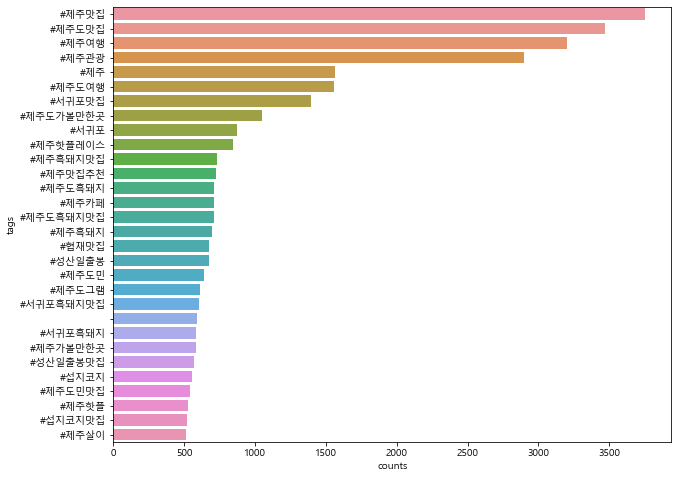

In [25]:
plt.figure(figsize=(10,8)) 
sns.barplot(x='counts', y='tags', data = tag_counts_df)

In [26]:
pip install wordcloud

In [27]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud    # 에러시  ! pip install wordcloud 실행
import platform

if platform.system() == 'Windows':   #윈도우의 경우
    font_path = "c:/Windows/Fonts/malgun.ttf"
elif platform.system() == "Darwin":   #Mac 의 경우
    font_path = "/Users/$USER/Library/Fonts/AppleGothic.ttf"

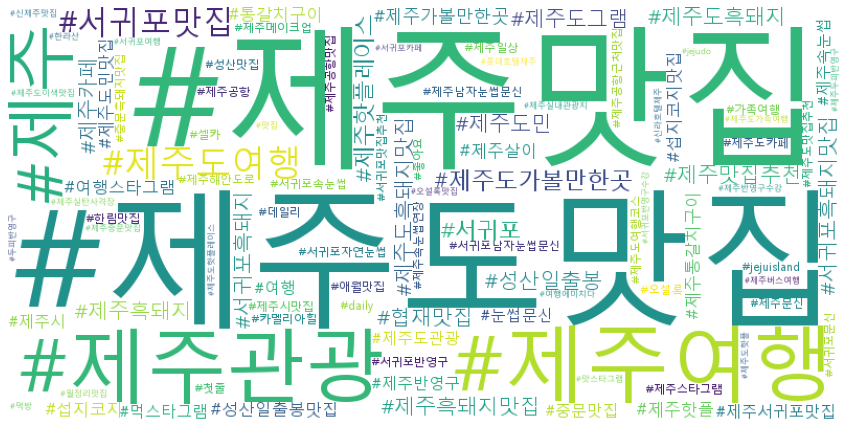

In [29]:
wordcloud=WordCloud(font_path= font_path, 
                    background_color="white",
                    max_words=100,
                    relative_scaling= 0.3,
                    width = 800,
                    height = 400
                 ).generate_from_frequencies(tag_counts_selected)  
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('2_tag-wordcloud.png')  

In [ ]:
400cb942c16b081cd66250fa95154d9e


In [31]:
#장소 검색 api(카카오 api)
#https://developers.kakao.com/ -> 가입 및 로그인 -> 내 애플리케이션 -> 애플리케이션 추가하기 -> 


In [35]:
import requests


In [46]:
#카카오 로컬 API를 활용한 장소 검색 함수 만들기
def find_places(searching):
    # ① 접속URL 만들기
    url = 'https://dapi.kakao.com/v2/local/search/keyword.json?query={}'.format(searching)
    # ② headers 입력하기
    headers = {
    "Authorization": "KakaoAK 400cb942c16b081cd66250fa95154d9e"
    }
    #print(requests.get(url, headers = headers).json())
    # ③ API 요청&정보 받기
    places = requests.get(url, headers = headers).json()['documents']
    # ④ 필요한 정보 선택하기
    place = places[0] 
    name = place['place_name']
    x=place['x']
    y=place['y']
    data = [name, x, y, searching] 
    return data

In [48]:
data = find_places('서울시청')
print(data)

['서울특별시청', '126.978652258823', '37.56682420267543', '서울시청']


In [50]:
#카카오 로컬 API를 활용한 장소 검색 함수 만들기
def find_places2(searching):
    # ① 접속URL 만들기
    url = 'https://dapi.kakao.com/v2/local/search/keyword.json?query={}'.format(searching)
    # ② headers 입력하기
    headers = {
    "Authorization": "KakaoAK 400cb942c16b081cd66250fa95154d9e"
    }
    #print(requests.get(url, headers = headers).json())
    # ③ API 요청&정보 받기
    places = requests.get(url, headers = headers).json()['documents']    
    return places

In [51]:
data = find_places2('합정 스타벅스')
print(data)
#daum.net -> 검색어 :  '합정 스타벅스' -> 검색 결과 비교

[{'address_name': '서울 마포구 서교동 395-166', 'category_group_code': 'CE7', 'category_group_name': '카페', 'category_name': '음식점 > 카페 > 커피전문점 > 스타벅스', 'distance': '', 'id': '26572121', 'phone': '', 'place_name': '스타벅스 서교점', 'place_url': 'http://place.map.kakao.com/26572121', 'road_address_name': '서울 마포구 양화로 78', 'x': '126.916980454434', 'y': '37.5514601750423'}, {'address_name': '서울 마포구 합정동 472', 'category_group_code': 'CE7', 'category_group_name': '카페', 'category_name': '음식점 > 카페 > 커피전문점 > 스타벅스', 'distance': '', 'id': '2057327896', 'phone': '1522-3232', 'place_name': '스타벅스 합정점', 'place_url': 'http://place.map.kakao.com/2057327896', 'road_address_name': '서울 마포구 월드컵로1길 14', 'x': '126.91253700818196', 'y': '37.54994959743763'}, {'address_name': '서울 마포구 서교동 490', 'category_group_code': 'CE7', 'category_group_name': '카페', 'category_name': '음식점 > 카페 > 커피전문점 > 스타벅스', 'distance': '', 'id': '288597324', 'phone': '', 'place_name': '스타벅스 합정폴리스R점', 'place_url': 'http://place.map.kakao.com/288597324', 'ro

In [52]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [56]:
raw_total = pd.read_excel('1_crawling_raw.xlsx')
raw_total.head()

,content,date,like,place,tags
0,더 늦기전에 제주도로 떠나쟈😍.#제주핫플레이스 간단히 1탄 모아봄!#제주여행 요 필...,2018-12-07,"1,402",NaN,"['#제주핫플레이스', '#제주여행', '#제주여행', '#제주도여행', '#제주가..."
1,12월에 제주도를 가야하는이유🍊.#제주핫플 모음 끝판왕😍이거 하나면 겨울 #제주여행...,2018-12-03,368,NaN,"['#제주핫플', '#제주여행', '#제주', '#제주도', '#제주도맛집', '#..."
2,11월 놓치지 말아야 할 제주 관광.가을바람이 최고조에 이르는 11월추운 겨울을 앞...,2018-11-02,166,NaN,"['#honestin', '#어니스틴', '#제주여행', '#제주', '#제주도',..."
3,국민학교세대#제주관광#제주살이#제주이주민#아라동주민#삼남매집 #새해첫날#드라이브#명...,2019-01-01,28,명월국민학교,"['#제주관광', '#제주살이', '#제주이주민', '#아라동주민', '#삼남매집'..."
4,#제주관광 #제주 #돔나이트 #스트레스 #풀자 #춤추며 #땀날려 #가끔은괜찮아 #인...,2019-01-01,12,NaN,"['#제주관광', '#제주', '#돔나이트', '#스트레스', '#풀자', '#춤추..."


In [57]:
location_counts = raw_total['place'].value_counts( )
location_counts

Jeju                    271
Jeju-do                 179
Jungle Book by Alice    108
Seogwipo                 66
제주도 크리스마스 박물관            59
                       ... 
대돈                        1
자연뜨락                      1
That's very               1
성산포                       1
세영수산                      1
Name: place, Length: 1028, dtype: int64

In [58]:
location_counts_df = pd.DataFrame(location_counts)
location_counts_df.head()

,place
Jeju,271
Jeju-do,179
Jungle Book by Alice,108
Seogwipo,66
제주도 크리스마스 박물관,59


In [59]:
location_counts_df.to_excel('3_location_counts.xlsx')

In [60]:
locations = list( location_counts.index )
locations 

['Jeju',
 'Jeju-do',
 'Jungle Book by Alice',
 'Seogwipo',
 '제주도 크리스마스 박물관',
 '할로비치',
 '제주에인감귤밭',
 'Jeju Island',
 '성산일출봉 城山日出峰  Seongsan Ilchulbong',
 '폼포코식당_pompokokitchen',
 '1100고지',
 'Nimome',
 '월정리해변',
 '석부작박물관',
 '고집돌우럭중문점',
 '제주도 애월읍',
 '알뜨르 비행장',
 '카멜리아 힐',
 '제주레포츠랜드',
 '제주 함덕 서우봉 해변',
 '밥깡패',
 '제주고궁한복카페 jeju gogung hanbok studio',
 '제주신화월드 Jeju Shinhwa World',
 '위미동백나무군락지',
 '제주도 서귀포 중문관광단지 濟州島西歸浦中文觀光團地',
 '연동 바오젠 거리',
 'Woljeongri Beach',
 '협재해변 Beach',
 '김녕미로공원 Jeju Kimnyoung Maze Park',
 '고래배꼽',
 '제주 성산 신산포구자연산횟집 회포장',
 '새별오름',
 '용눈이오름',
 '용머리해안',
 '하이엔드 제주',
 '캔디원',
 '사려니숲길',
 '제주빅볼랜드',
 '옹포리',
 '한라산',
 '제주커피박물관 Baum',
 '휴애리 자연생활공원',
 'Jeju Aewol',
 '마마뜰',
 '삼무공원',
 '위미동백나무군락',
 '제주어린왕자게스트하우스',
 '위미2리 동백군락지',
 'Jeju Island 제주특별자치도 济州道',
 '서귀포 느영나영 게스트하우스',
 '한라산 (漢拏山, Hallasan)',
 '제주해남',
 '광치기해변',
 '카페한라산',
 '서우봉',
 '옹포별장가든',
 '월정리카페콧수염',
 '성이시돌목장',
 '제주 송악산',
 '에코랜드',
 '牛岛 Udo Island 우도',
 '제주 꿈꾸는고래 스쿠버&게스트하우스',
 '카페브리프',
 '곽지해수욕장',
 '아줄레주',
 '산굼부리',
 '소세지가게',
 '르페도라펜션'

In [61]:
len(locations)

1028

In [53]:
from tqdm.notebook import tqdm

In [62]:
import time
locations_inform = [ ]
for location in tqdm(locations):
    try:
        data = find_places(location)       
        locations_inform.append(data) 
        time.sleep(0.5) 
    except:
        pass
locations_inform

[['Jeju in aA', '126.83650369902168', '33.53833652360498', 'Jeju'],
 ['서귀포잠수함', '126.558616052674', '33.2393033784206', 'Seogwipo'],
 ['바이나흐튼 크리스마스박물관', '126.32785786016811', '33.2915720831759', '제주도 크리스마스 박물관'],
 ['할로비치', '127.020825988861', '37.5182108620338', '할로비치'],
 ['제주에인감귤밭', '126.5390139270361', '33.25656069063887', '제주에인감귤밭'],
 ['제주도', '126.54587355630036', '33.379777816446165', 'Jeju Island'],
 ['한라산1100고지', '126.462219691112', '33.3580781709788', '1100고지'],
 ['월정리해수욕장', '126.795805057888', '33.556469394054', '월정리해변'],
 ['석부작박물관', '126.536501983154', '33.2504031491774', '석부작박물관'],
 ['고집돌우럭 중문점', '126.416704762779', '33.2579811121134', '고집돌우럭중문점'],
 ['올레길 17코스(광령-제주원도심 올레)', '126.439341083568', '33.4608856490895', '제주도 애월읍'],
 ['알뜨르비행장', '126.271527320164', '33.2047161778831', '알뜨르 비행장'],
 ['카멜리아힐', '126.370009467525', '33.2896344311608', '카멜리아 힐'],
 ['제주레포츠랜드', '126.6387551242765', '33.48206819907232', '제주레포츠랜드'],
 ['함덕해수욕장', '126.669238934013', '33.5430615661113', '제주 함덕 서우

In [64]:
locations_inform_df = pd.DataFrame(locations_inform)
locations_inform_df.columns = ['name_official','경도','위도','인스타위치명']
locations_inform_df.to_excel('3_locations.xlsx', index=False)


In [65]:
locations_inform_df

,name_official,경도,위도,인스타위치명
0,Jeju in aA,126.83650369902168,33.53833652360498,Jeju
1,서귀포잠수함,126.558616052674,33.2393033784206,Seogwipo
2,바이나흐튼 크리스마스박물관,126.32785786016811,33.2915720831759,제주도 크리스마스 박물관
3,할로비치,127.020825988861,37.5182108620338,할로비치
4,제주에인감귤밭,126.5390139270361,33.25656069063887,제주에인감귤밭
...,...,...,...,...
814,카페오길,126.842253887549,33.5318912452691,카페오길
815,대돈,126.52676040608,33.5158651251043,대돈
816,자연뜨락,126.488970502278,33.4773000120236,자연뜨락
817,성산포항,126.933293813424,33.4734596563682,성산포


In [74]:
location_counts_df = pd.read_excel('3_location_counts.xlsx', index_col=0)
print(location_counts_df)

locations_inform_df = pd.read_excel('3_locations.xlsx')
print(locations_inform_df)

                      place
Jeju                    271
Jeju-do                 179
Jungle Book by Alice    108
Seogwipo                 66
제주도 크리스마스 박물관            59
...                     ...
대돈                        1
자연뜨락                      1
That's very               1
성산포                       1
세영수산                      1

[1028 rows x 1 columns]
      name_official          경도         위도         인스타위치명
0        Jeju in aA  126.836504  33.538337           Jeju
1            서귀포잠수함  126.558616  33.239303       Seogwipo
2    바이나흐튼 크리스마스박물관  126.327858  33.291572  제주도 크리스마스 박물관
3              할로비치  127.020826  37.518211           할로비치
4           제주에인감귤밭  126.539014  33.256561        제주에인감귤밭
..              ...         ...        ...            ...
814            카페오길  126.842254  33.531891           카페오길
815              대돈  126.526760  33.515865             대돈
816            자연뜨락  126.488971  33.477300           자연뜨락
817            성산포항  126.933294  33.473460            성산포
8

In [76]:
#키와 인덱스를 조합하여 데이터프레임을 합치기


location_data = pd.merge(locations_inform_df, location_counts_df, 
                         how = 'inner', left_on = 'name_official', right_index=True)

location_data

,name_official,경도,위도,인스타위치명,place
1,서귀포잠수함,126.558616,33.239303,Seogwipo,1
706,서귀포잠수함,126.558616,33.239303,서귀포잠수함,1
3,할로비치,127.020826,37.518211,할로비치,51
4,제주에인감귤밭,126.539014,33.256561,제주에인감귤밭,48
5,제주도,126.545874,33.379778,Jeju Island,4
...,...,...,...,...,...
809,플레이스엉물,126.900660,33.489656,플레이스엉물,1
814,카페오길,126.842254,33.531891,카페오길,1
815,대돈,126.526760,33.515865,대돈,1
816,자연뜨락,126.488971,33.477300,자연뜨락,1


In [77]:
location_data['name_official'].value_counts()

자매국수 본점         3
오설록티뮤지엄         3
용두암             2
산굼부리            2
위미동백나무군락        2
               ..
하도핑크            1
면뽑는선생 만두빚는아내    1
용연구름다리          1
수망일기            1
서귀포흑돼지명가        1
Name: name_official, Length: 398, dtype: int64

In [78]:
location_data = location_data.pivot_table(index = ['name_official','경도','위도'], values = 'place', aggfunc='sum')
location_data.head()

,,,place
name_official,경도,위도,
702키친,126.534134,33.498835,1
73st,126.455109,33.456989,1
가드망제,126.532954,33.500991,1
가시식당,126.771438,33.353060,2
가시아방국수,126.918065,33.438605,2


In [79]:
location_data.to_excel('3_location_inform.xlsx')

In [81]:
#세련된 시각화 도구 : folium(지도), plotly(interactive)

In [82]:
#folium을 이용한 지도 그리기

In [84]:
location_data = pd.read_excel('3_location_inform.xlsx')
location_data.info()
location_data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name_official  398 non-null    object 
 1   경도             399 non-null    float64
 2   위도             399 non-null    float64
 3   place          399 non-null    int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 12.6+ KB


,name_official,경도,위도,place
0,702키친,126.534134,33.498835,1
1,73st,126.455109,33.456989,1
2,가드망제,126.532954,33.500991,1
3,가시식당,126.771438,33.353060,2
4,가시아방국수,126.918065,33.438605,2
...,...,...,...,...
394,환상숲곶자왈공원,126.263028,33.322907,1
395,황궁쟁반짜장,127.394311,36.338770,1
396,황우지해안,126.550528,33.241467,2
397,훈남횟집,126.667858,33.542086,1


In [85]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [86]:
from pandas import DataFrame

#예제 데이터 만들기

ex = {'경도' : [127.061026,127.047883,127.899220,128.980455,127.104071,127.102490,127.088387,126.809957,127.010861,126.836078
                ,127.014217,126.886859,127.031702,126.880898,127.028726,126.897710,126.910288,127.043189,127.071184,127.076812
                ,127.045022,126.982419,126.840285,127.115873,126.885320,127.078464,127.057100,127.020945,129.068324,129.059574
                ,126.927655,127.034302,129.106330,126.980242,126.945099,129.034599,127.054649,127.019556,127.053198,127.031005
                ,127.058560,127.078519,127.056141,129.034605,126.888485,129.070117,127.057746,126.929288,127.054163,129.060972],
     '위도' : [37.493922,37.505675,37.471711,35.159774,37.500249,37.515149,37.549245,37.562013,37.552153,37.538927,37.492388
              ,37.480390,37.588485,37.504067,37.608392,37.503693,37.579029,37.580073,37.552103,37.545461,37.580196,37.562274
              ,37.535419,37.527477,37.526139,37.648247,37.512939,37.517574,35.202902,35.144776,37.499229,35.150069,35.141176
              ,37.479403,37.512569,35.123196,37.546718,37.553668,37.488742,37.493653,37.498462,37.556602,37.544180,35.111532
              ,37.508058,35.085777,37.546103,37.483899,37.489299,35.143421],
     '구분' : ['음식','음식','음식','음식','생활서비스','음식','음식','음식','음식','음식','음식','음식','음식','음식','음식'
             ,'음식','음식','소매','음식','음식','음식','음식','소매','음식','소매','음식','음식','음식','음식','음식','음식'
             ,'음식','음식','음식','음식','소매','음식','음식','의료','음식','음식','음식','소매','음식','음식','음식','음식'
             ,'음식','음식','음식']}

ex=DataFrame(ex)
ex

,경도,위도,구분
0,127.061026,37.493922,음식
1,127.047883,37.505675,음식
2,127.899220,37.471711,음식
3,128.980455,35.159774,음식
4,127.104071,37.500249,생활서비스
5,127.102490,37.515149,음식
6,127.088387,37.549245,음식
7,126.809957,37.562013,음식
8,127.010861,37.552153,음식
9,126.836078,37.538927,음식


In [87]:
import folium

In [90]:
lat=ex['위도'].mean()
long=ex['경도'].mean()

In [100]:
m = folium.Map([lat,long],zoom_start=9)
m

In [103]:
for i in ex.index:
    sub_lat =  ex.loc[i,'위도']
    sub_long = ex.loc[i,'경도']
    
    title = ex.loc[i,'구분']
    
    #지도에 데이터 찍어서 보여주기
    folium.Marker([sub_lat,sub_long],tooltip = title).add_to(m)
m
m.save('example.html')

In [106]:
m = folium.Map([lat,long],zoom_start=9)
for i in ex.index:
    sub_lat =  ex.loc[i,'위도']
    sub_long = ex.loc[i,'경도']    
    title = ex.loc[i,'구분']  
    #구분이 소매면 빨간색으로 표시, default는 녹색    
    color = 'green'
    if ex.loc[i,'구분'] == '소매':
        color = "red"        
    #지도에 동그라미로 데이터 찍기    
    folium.CircleMarker([sub_lat,sub_long],color=color,radius = 10, tooltip=title).add_to(m)
m
m.save('example2.html')


In [108]:
location_data

,name_official,경도,위도,place
0,702키친,126.534134,33.498835,1
1,73st,126.455109,33.456989,1
2,가드망제,126.532954,33.500991,1
3,가시식당,126.771438,33.353060,2
4,가시아방국수,126.918065,33.438605,2
...,...,...,...,...
394,환상숲곶자왈공원,126.263028,33.322907,1
395,황궁쟁반짜장,127.394311,36.338770,1
396,황우지해안,126.550528,33.241467,2
397,훈남횟집,126.667858,33.542086,1


In [109]:
import folium

Mt_Hanla =[33.362500, 126.533694]
map_jeju = folium.Map(location = Mt_Hanla, zoom_start = 11)

for i in range(len(location_data)):
    name = location_data ['name_official'][i]    # 공식명칭
    count = location_data ['place'][i]           # 게시글 개수
    size = int(count)*2
    long = float(location_data['위도'][i])      
    lat = float(location_data['경도'][i])       
    folium.CircleMarker((long,lat), radius = size, color='red', popup=name).add_to(map_jeju)
    
map_jeju
map_jeju.save('3_jeju.html') 

In [110]:
#마커클러스터

In [112]:
from folium.plugins import MarkerCluster

locations = []
names = []

for i in range(len(location_data)):
    data = location_data.iloc[i]  # 행 하나씩
    locations.append((float(data['위도']),float(data['경도'])))    # 위도 , 경도 순으로..
    names.append(data['name_official'])


Mt_Hanla =[33.362500, 126.533694]
map_jeju2 = folium.Map(location = Mt_Hanla, zoom_start = 11)

marker_cluster = MarkerCluster(
    locations=locations, popups=names,
    name='Jeju',
    overlay=True,
    control=True,

)
marker_cluster.add_to(map_jeju2)
folium.LayerControl().add_to(map_jeju2)


map_jeju2

In [113]:
map_jeju2.save('3_jeju_cluster.html') 

In [114]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][0]

{'type': 'Feature',
 'properties': {'GEO_ID': '0500000US01001',
  'STATE': '01',
  'COUNTY': '001',
  'NAME': 'Autauga',
  'LSAD': 'County',
  'CENSUSAREA': 594.436},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-86.496774, 32.344437],
    [-86.717897, 32.402814],
    [-86.814912, 32.340803],
    [-86.890581, 32.502974],
    [-86.917595, 32.664169],
    [-86.71339, 32.661732],
    [-86.714219, 32.705694],
    [-86.413116, 32.707386],
    [-86.411172, 32.409937],
    [-86.496774, 32.344437]]]},
 'id': '01001'}

In [ ]:
#pip install plotly

In [115]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

import plotly.express as px

fig = px.choropleth(df, geojson=counties, locations='fips', color='unemp',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           scope="usa",
                           labels={'unemp':'unemployment rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [122]:
import webbrowser
import folium, json
import pandas as pd

m = folium.Map(location=[36, 127], tiles="OpenStreetMap", zoom_start=8)
geo_data = json.load(open('skorea_municipalities_geo_simple.json', encoding='utf-8'))

df = pd.read_csv('ddd.csv', encoding='utf-8')
folium.Choropleth(geo_data=geo_data,
                  data = df,
                  columns=['sigun', 'avg_income'],
                  key_on='feature.properties.name',
                  fill_color='PuBuGn',
                  fill_opacity=0.8
                  ).add_to(m)

m.save('folium_kr.html')
webbrowser.open_new("folium_kr.html")

True

In [131]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import platform

from matplotlib import font_manager, rc

if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
else:
    print("Unknown system")

In [315]:
population = pd.read_excel('population_raw_data.xlsx', header=1)


In [316]:
population

,행정구역(동읍면)별(1),행정구역(동읍면)별(2),항목,계,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+
0,전국,소계,총인구수 (명),51696216.0,3541061.0,3217367.0,3517868,4016272.0,2237345.0,1781229.0,1457890,909130.0,416164.0,141488.0,34844,17562.0
1,NaN,NaN,남자인구수 (명),25827594.0,1877127.0,1682988.0,1806754,2045265.0,1072395.0,806680.0,600607,319391.0,113221.0,32695.0,7658,4137.0
2,NaN,NaN,여자인구수 (명),25868622.0,1663934.0,1534379.0,1711114,1971007.0,1164950.0,974549.0,857283,589739.0,302943.0,108793.0,27186,13425.0
3,서울특별시,소계,총인구수 (명),9930616.0,690728.0,751973.0,803507,817467.0,448956.0,350580.0,251961,141649.0,66067.0,24153.0,7058,5475.0
4,NaN,NaN,남자인구수 (명),4876789.0,347534.0,372249.0,402358,410076.0,211568.0,163766.0,112076,54033.0,19595.0,6146.0,1900,1406.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,NaN,NaN,남자인구수 (명),235977.0,17377.0,13118.0,15084,18350.0,8474.0,6782.0,4941,2737.0,854.0,226.0,53,17.0
842,NaN,NaN,여자인구수 (명),234688.0,15261.0,12245.0,14687,18062.0,9265.0,7877.0,7178,5649.0,3122.0,1387.0,460,137.0
843,NaN,서귀포시,총인구수 (명),170932.0,10505.0,8067.0,9120,11606.0,8686.0,7460.0,6456,4521.0,1855.0,733.0,242,77.0
844,NaN,NaN,남자인구수 (명),86568.0,5600.0,4247.0,4693,6082.0,4237.0,3441.0,2611,1494.0,370.0,103.0,29,9.0


In [317]:
#forward fill <-> bfill(backward)
population.fillna(method='ffill') #population.fillna(method='pad')
population.fillna(method='pad', inplace=True)

In [318]:
population.rename(columns = {'행정구역(동읍면)별(1)':'광역시도', 
                             '행정구역(동읍면)별(2)':'시도', 
                             '계':'인구수'}, inplace=True)

In [319]:
population.광역시도.unique()

array(['전국', '서울특별시', '부산광역시', '대구광역시', '인천광역시', '광주광역시', '대전광역시',
       '울산광역시', '세종특별자치시', '경기도', '강원도', '충청북도', '충청남도', '전라북도', '전라남도',
       '경상북도', '경상남도', '제주특별자치도'], dtype=object)

In [320]:
population.시도.unique()

array(['소계', '종로구', '중구', '용산구', '성동구', '광진구', '동대문구', '중랑구', '성북구',
       '강북구', '도봉구', '노원구', '은평구', '서대문구', '마포구', '양천구', '강서구', '구로구',
       '금천구', '영등포구', '동작구', '관악구', '서초구', '강남구', '송파구', '강동구', '서구',
       '동구', '영도구', '부산진구', '동래구', '남구', '북구', '해운대구', '사하구', '금정구',
       '연제구', '수영구', '사상구', '기장군', '수성구', '달서구', '달성군', '연수구', '남동구',
       '부평구', '계양구', '강화군', '옹진군', '광산구', '유성구', '대덕구', '울주군', '세종특별자치시',
       '수원시', '장안구', '권선구', '팔달구', '영통구', '성남시', '수정구', '중원구', '분당구',
       '의정부시', '안양시', '만안구', '동안구', '부천시', '소사구', '오정구', '원미구', '광명시',
       '평택시', '동두천시', '안산시', '상록구', '단원구', '고양시', '덕양구', '일산동구', '일산서구',
       '과천시', '구리시', '남양주시', '오산시', '시흥시', '군포시', '의왕시', '하남시', '용인시',
       '처인구', '기흥구', '수지구', '파주시', '이천시', '안성시', '김포시', '화성시', '광주시',
       '양주시', '포천시', '여주시', '연천군', '가평군', '양평군', '춘천시', '원주시', '강릉시',
       '동해시', '태백시', '속초시', '삼척시', '홍천군', '횡성군', '영월군', '평창군', '정선군',
       '철원군', '화천군', '양구군', '인제군', '고성군', '양양군', '청주시', '상당구', '서원구',
       '흥덕구'

In [321]:
population=population[population.광역시도!=population.시도]

In [322]:
population=population[(population.시도 != '소계') | 
                      (population.광역시도=='세종특별자치시')]

In [323]:
population.광역시도.unique()

array(['서울특별시', '부산광역시', '대구광역시', '인천광역시', '광주광역시', '대전광역시', '울산광역시',
       '세종특별자치시', '경기도', '강원도', '충청북도', '충청남도', '전라북도', '전라남도', '경상북도',
       '경상남도', '제주특별자치도'], dtype=object)

In [324]:
population.loc[population.광역시도=='세종특별자치시','시도']='세종시'

In [325]:
population.head()

,광역시도,시도,항목,인구수,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+
6,서울특별시,종로구,총인구수 (명),152737.0,11379.0,11891.0,10684,10379.0,7411.0,6636.0,5263,3104.0,1480.0,602.0,234,220.0
7,서울특별시,종로구,남자인구수 (명),75201.0,5620.0,6181.0,5387,5034.0,3411.0,3009.0,2311,1289.0,506.0,207.0,89,73.0
8,서울특별시,종로구,여자인구수 (명),77536.0,5759.0,5710.0,5297,5345.0,4000.0,3627.0,2952,1815.0,974.0,395.0,145,147.0
9,서울특별시,중구,총인구수 (명),125249.0,8216.0,9529.0,10332,10107.0,6399.0,5313.0,4127,2502.0,1260.0,469.0,158,160.0
10,서울특별시,중구,남자인구수 (명),62204.0,4142.0,4792.0,5192,5221.0,3113.0,2405.0,1752,929.0,414.0,132.0,56,51.0


In [326]:
population.광역시도.unique()

array(['서울특별시', '부산광역시', '대구광역시', '인천광역시', '광주광역시', '대전광역시', '울산광역시',
       '세종특별자치시', '경기도', '강원도', '충청북도', '충청남도', '전라북도', '전라남도', '경상북도',
       '경상남도', '제주특별자치도'], dtype=object)

In [327]:
population

,광역시도,시도,항목,인구수,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+
6,서울특별시,종로구,총인구수 (명),152737.0,11379.0,11891.0,10684,10379.0,7411.0,6636.0,5263,3104.0,1480.0,602.0,234,220.0
7,서울특별시,종로구,남자인구수 (명),75201.0,5620.0,6181.0,5387,5034.0,3411.0,3009.0,2311,1289.0,506.0,207.0,89,73.0
8,서울특별시,종로구,여자인구수 (명),77536.0,5759.0,5710.0,5297,5345.0,4000.0,3627.0,2952,1815.0,974.0,395.0,145,147.0
9,서울특별시,중구,총인구수 (명),125249.0,8216.0,9529.0,10332,10107.0,6399.0,5313.0,4127,2502.0,1260.0,469.0,158,160.0
10,서울특별시,중구,남자인구수 (명),62204.0,4142.0,4792.0,5192,5221.0,3113.0,2405.0,1752,929.0,414.0,132.0,56,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,제주특별자치도,제주시,남자인구수 (명),235977.0,17377.0,13118.0,15084,18350.0,8474.0,6782.0,4941,2737.0,854.0,226.0,53,17.0
842,제주특별자치도,제주시,여자인구수 (명),234688.0,15261.0,12245.0,14687,18062.0,9265.0,7877.0,7178,5649.0,3122.0,1387.0,460,137.0
843,제주특별자치도,서귀포시,총인구수 (명),170932.0,10505.0,8067.0,9120,11606.0,8686.0,7460.0,6456,4521.0,1855.0,733.0,242,77.0
844,제주특별자치도,서귀포시,남자인구수 (명),86568.0,5600.0,4247.0,4693,6082.0,4237.0,3441.0,2611,1494.0,370.0,103.0,29,9.0


In [328]:
condition = lambda sido, gu: (sido[-1] == '도')&(gu[-1] == '구')


In [329]:
#population[[condition(population['광역시도'][n], population['시도'][n]) for n in population.index]]

,광역시도,시도,항목,인구수,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+
258,경기도,장안구,총인구수 (명),296479.0,25238.0,20255.0,18955,22771.0,9409.0,7782.0,6094,3950.0,1936.0,705.0,166,74.0
259,경기도,장안구,남자인구수 (명),148987.0,13663.0,11019.0,9698,11358.0,4467.0,3429.0,2534,1365.0,541.0,184.0,34,20.0
260,경기도,장안구,여자인구수 (명),147492.0,11575.0,9236.0,9257,11413.0,4942.0,4353.0,3560,2585.0,1395.0,521.0,132,54.0
261,경기도,권선구,총인구수 (명),358393.0,27160.0,26687.0,29864,32859.0,10635.0,7910.0,6009,3739.0,1789.0,632.0,147,63.0
262,경기도,권선구,남자인구수 (명),180766.0,14031.0,13690.0,15475,17095.0,5191.0,3702.0,2391,1288.0,477.0,133.0,30,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,경상남도,마산회원구,남자인구수 (명),106469.0,8041.0,6508.0,6917,8183.0,4976.0,3257.0,2116,951.0,251.0,60.0,10,5.0
782,경상남도,마산회원구,여자인구수 (명),104322.0,6474.0,5515.0,6023,7791.0,5474.0,3661.0,2910,1809.0,885.0,282.0,54,26.0
783,경상남도,진해구,총인구수 (명),187313.0,10250.0,9905.0,13941,18074.0,7300.0,5497.0,4424,2701.0,1176.0,377.0,75,17.0
784,경상남도,진해구,남자인구수 (명),95701.0,5739.0,5430.0,7280,9406.0,3552.0,2455.0,1791,923.0,306.0,77.0,11,4.0


In [330]:
population = population[[not condition(population['광역시도'][n], population['시도'][n]) for n in population.index]]


In [331]:
population

,광역시도,시도,항목,인구수,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+
6,서울특별시,종로구,총인구수 (명),152737.0,11379.0,11891.0,10684,10379.0,7411.0,6636.0,5263,3104.0,1480.0,602.0,234,220.0
7,서울특별시,종로구,남자인구수 (명),75201.0,5620.0,6181.0,5387,5034.0,3411.0,3009.0,2311,1289.0,506.0,207.0,89,73.0
8,서울특별시,종로구,여자인구수 (명),77536.0,5759.0,5710.0,5297,5345.0,4000.0,3627.0,2952,1815.0,974.0,395.0,145,147.0
9,서울특별시,중구,총인구수 (명),125249.0,8216.0,9529.0,10332,10107.0,6399.0,5313.0,4127,2502.0,1260.0,469.0,158,160.0
10,서울특별시,중구,남자인구수 (명),62204.0,4142.0,4792.0,5192,5221.0,3113.0,2405.0,1752,929.0,414.0,132.0,56,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,제주특별자치도,제주시,남자인구수 (명),235977.0,17377.0,13118.0,15084,18350.0,8474.0,6782.0,4941,2737.0,854.0,226.0,53,17.0
842,제주특별자치도,제주시,여자인구수 (명),234688.0,15261.0,12245.0,14687,18062.0,9265.0,7877.0,7178,5649.0,3122.0,1387.0,460,137.0
843,제주특별자치도,서귀포시,총인구수 (명),170932.0,10505.0,8067.0,9120,11606.0,8686.0,7460.0,6456,4521.0,1855.0,733.0,242,77.0
844,제주특별자치도,서귀포시,남자인구수 (명),86568.0,5600.0,4247.0,4693,6082.0,4237.0,3441.0,2611,1494.0,370.0,103.0,29,9.0


In [332]:
population.index

Int64Index([  6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
            ...
            833, 834, 835, 836, 840, 841, 842, 843, 844, 845],
           dtype='int64', length=687)

In [333]:
population['광역시도'][6]

'서울특별시'

In [277]:
population['시도'][6]

'종로구'

In [280]:
[not condition(population['광역시도'][n], population['시도'][n]) for n in population.index]

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,

In [247]:
population.시도.unique()

array(['종로구', '중구', '용산구', '성동구', '광진구', '동대문구', '중랑구', '성북구', '강북구',
       '도봉구', '노원구', '은평구', '서대문구', '마포구', '양천구', '강서구', '구로구', '금천구',
       '영등포구', '동작구', '관악구', '서초구', '강남구', '송파구', '강동구', '서구', '동구',
       '영도구', '부산진구', '동래구', '남구', '북구', '해운대구', '사하구', '금정구', '연제구',
       '수영구', '사상구', '기장군', '수성구', '달서구', '달성군', '연수구', '남동구', '부평구',
       '계양구', '강화군', '옹진군', '광산구', '유성구', '대덕구', '울주군', '세종시', '수원시',
       '성남시', '의정부시', '안양시', '부천시', '광명시', '평택시', '동두천시', '안산시', '고양시',
       '과천시', '구리시', '남양주시', '오산시', '시흥시', '군포시', '의왕시', '하남시', '용인시',
       '파주시', '이천시', '안성시', '김포시', '화성시', '광주시', '양주시', '포천시', '여주시',
       '연천군', '가평군', '양평군', '춘천시', '원주시', '강릉시', '동해시', '태백시', '속초시',
       '삼척시', '홍천군', '횡성군', '영월군', '평창군', '정선군', '철원군', '화천군', '양구군',
       '인제군', '고성군', '양양군', '청주시', '충주시', '제천시', '보은군', '옥천군', '영동군',
       '증평군', '진천군', '괴산군', '음성군', '단양군', '천안시', '공주시', '보령시', '아산시',
       '서산시', '논산시', '계룡시', '당진시', '금산군', '부여군', '서천군', '청양군', '홍성군',
       '예산군', '태안

In [248]:
population

,광역시도,시도,항목,인구수,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+,구분,20-39세,65세이상
6,서울특별시,종로구,총인구수 (명),152737.0,11379.0,11891.0,10684,10379.0,7411.0,6636.0,5263,3104.0,1480.0,602.0,234,220.0,합계,44333.0,24950.0
7,서울특별시,종로구,남자인구수 (명),75201.0,5620.0,6181.0,5387,5034.0,3411.0,3009.0,2311,1289.0,506.0,207.0,89,73.0,남자,22222.0,10895.0
8,서울특별시,종로구,여자인구수 (명),77536.0,5759.0,5710.0,5297,5345.0,4000.0,3627.0,2952,1815.0,974.0,395.0,145,147.0,여자,22111.0,14055.0
9,서울특별시,중구,총인구수 (명),125249.0,8216.0,9529.0,10332,10107.0,6399.0,5313.0,4127,2502.0,1260.0,469.0,158,160.0,합계,38184.0,20388.0
10,서울특별시,중구,남자인구수 (명),62204.0,4142.0,4792.0,5192,5221.0,3113.0,2405.0,1752,929.0,414.0,132.0,56,51.0,남자,19347.0,8852.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,제주특별자치도,제주시,남자인구수 (명),235977.0,17377.0,13118.0,15084,18350.0,8474.0,6782.0,4941,2737.0,854.0,226.0,53,17.0,남자,63929.0,24084.0
842,제주특별자치도,제주시,여자인구수 (명),234688.0,15261.0,12245.0,14687,18062.0,9265.0,7877.0,7178,5649.0,3122.0,1387.0,460,137.0,여자,60255.0,35075.0
843,제주특별자치도,서귀포시,총인구수 (명),170932.0,10505.0,8067.0,9120,11606.0,8686.0,7460.0,6456,4521.0,1855.0,733.0,242,77.0,합계,39298.0,30030.0
844,제주특별자치도,서귀포시,남자인구수 (명),86568.0,5600.0,4247.0,4693,6082.0,4237.0,3441.0,2611,1494.0,370.0,103.0,29,9.0,남자,20622.0,12294.0


In [249]:
tmp = []

for index, row in population.iterrows():
    #print(row)
    if row['항목'] == '총인구수 (명)':
        tmp.append('합계')
    elif row['항목'] == '남자인구수 (명)':
        tmp.append('남자')
    elif row['항목'] == '여자인구수 (명)':
        tmp.append('여자')
        
population['구분'] = tmp


In [250]:
population.head()
population.columns

Index(['광역시도', '시도', '항목', '인구수', '20 - 24세', '25 - 29세', '30 - 34세',
       '35 - 39세', '65 - 69세', '70 - 74세', '75 - 79세', '80 - 84세', '85 - 89세',
       '90 - 94세', '95 - 99세', '100+', '구분', '20-39세', '65세이상'],
      dtype='object')

In [251]:
population['20-39세'] = population['20 - 24세'] + population['25 - 29세'] + population['30 - 34세'] + population['35 - 39세']
    
population['65세이상'] = population['65 - 69세'] + population['70 - 74세'] + \
                        population['75 - 79세'] + population['80 - 84세'] +  \
                        population['85 - 89세'] + population['90 - 94세'] +  \
                        population['95 - 99세'] + population['100+']

In [252]:
population.head()

,광역시도,시도,항목,인구수,20 - 24세,25 - 29세,30 - 34세,35 - 39세,65 - 69세,70 - 74세,75 - 79세,80 - 84세,85 - 89세,90 - 94세,95 - 99세,100+,구분,20-39세,65세이상
6,서울특별시,종로구,총인구수 (명),152737.0,11379.0,11891.0,10684,10379.0,7411.0,6636.0,5263,3104.0,1480.0,602.0,234,220.0,합계,44333.0,24950.0
7,서울특별시,종로구,남자인구수 (명),75201.0,5620.0,6181.0,5387,5034.0,3411.0,3009.0,2311,1289.0,506.0,207.0,89,73.0,남자,22222.0,10895.0
8,서울특별시,종로구,여자인구수 (명),77536.0,5759.0,5710.0,5297,5345.0,4000.0,3627.0,2952,1815.0,974.0,395.0,145,147.0,여자,22111.0,14055.0
9,서울특별시,중구,총인구수 (명),125249.0,8216.0,9529.0,10332,10107.0,6399.0,5313.0,4127,2502.0,1260.0,469.0,158,160.0,합계,38184.0,20388.0
10,서울특별시,중구,남자인구수 (명),62204.0,4142.0,4792.0,5192,5221.0,3113.0,2405.0,1752,929.0,414.0,132.0,56,51.0,남자,19347.0,8852.0


In [253]:
pop = pd.pivot_table(population, 
                     index = ['광역시도', '시도'], 
                     columns = ['구분'],
                     values = ['인구수', '20-39세', '65세이상'])
pop

20-39세                        65세이상                         인구수  \
구분              남자        여자        합계       남자       여자       합계        남자   
광역시도 시도                                                                       
강원도  강릉시   26286.0   23098.0   49384.0  15767.0  21912.0  37679.0  106231.0   
     고성군    4494.0    2529.0    7023.0   2900.0   4251.0   7151.0   15899.0   
     동해시   11511.0    9753.0   21264.0   6392.0   8732.0  15124.0   47166.0   
     삼척시    8708.0    7115.0   15823.0   5892.0   8718.0  14610.0   35253.0   
     속초시    9956.0    8752.0   18708.0   5139.0   7613.0  12752.0   40288.0   
...            ...       ...       ...      ...      ...      ...       ...   
충청북도 제천시   16563.0   14279.0   30842.0  10227.0  13904.0  24131.0   68444.0   
     증평군    5531.0    4554.0   10085.0   2206.0   3117.0   5323.0   19110.0   
     진천군    9391.0    7622.0   17013.0   4731.0   6575.0  11306.0   36387.0   
     청주시  128318.0  115719.0  244037.0  37882.0  53671.0  91553.0  419323.0   
     충주시   26600.0   22757.0   49357.0  14407.0  20383.0  34790.0  104877.0   

                              
구분              여자        합계  
광역시도 시도                       
강원도  강릉시  107615.0  213846.0  
     고성군   14215.0   30114.0  
     동해시   46131.0   93297.0  
     삼척시   34346.0   69599.0  
     속초시   41505.0   81793.0  
...            ...       ...  
충청북도 제천시   68073.0  136517.0  
     증평군   18198.0   37308.0  
     진천군   33563.0   69950.0  
     청주시  415874.0  835197.0  
     충주시  103473.0  208350.0  

[229 rows x 9 columns]

In [254]:
pop['소멸비율'] = pop['20-39세','여자'] / (pop['65세이상','합계'] / 2)
pop.head()       #         23098.0 / (37679.0 / 2)

20-39세                      65세이상                         인구수  \
구분             남자       여자       합계       남자       여자       합계        남자   
광역시도 시도                                                                    
강원도  강릉시  26286.0  23098.0  49384.0  15767.0  21912.0  37679.0  106231.0   
     고성군   4494.0   2529.0   7023.0   2900.0   4251.0   7151.0   15899.0   
     동해시  11511.0   9753.0  21264.0   6392.0   8732.0  15124.0   47166.0   
     삼척시   8708.0   7115.0  15823.0   5892.0   8718.0  14610.0   35253.0   
     속초시   9956.0   8752.0  18708.0   5139.0   7613.0  12752.0   40288.0   

                                  소멸비율  
구분              여자        합계            
광역시도 시도                                 
강원도  강릉시  107615.0  213846.0  1.226041  
     고성군   14215.0   30114.0  0.707314  
     동해시   46131.0   93297.0  1.289738  
     삼척시   34346.0   69599.0  0.973990  
     속초시   41505.0   81793.0  1.372647

In [255]:
pop['소멸위기지역'] = pop['소멸비율'] < 1.0
pop.head()

20-39세                      65세이상                         인구수  \
구분             남자       여자       합계       남자       여자       합계        남자   
광역시도 시도                                                                    
강원도  강릉시  26286.0  23098.0  49384.0  15767.0  21912.0  37679.0  106231.0   
     고성군   4494.0   2529.0   7023.0   2900.0   4251.0   7151.0   15899.0   
     동해시  11511.0   9753.0  21264.0   6392.0   8732.0  15124.0   47166.0   
     삼척시   8708.0   7115.0  15823.0   5892.0   8718.0  14610.0   35253.0   
     속초시   9956.0   8752.0  18708.0   5139.0   7613.0  12752.0   40288.0   

                                  소멸비율 소멸위기지역  
구분              여자        합계                   
광역시도 시도                                        
강원도  강릉시  107615.0  213846.0  1.226041  False  
     고성군   14215.0   30114.0  0.707314   True  
     동해시   46131.0   93297.0  1.289738  False  
     삼척시   34346.0   69599.0  0.973990   True  
     속초시   41505.0   81793.0  1.372647  False

In [256]:
pop.sort_values(by="소멸비율", ascending=True)

20-39세                       65세이상                         인구수  \
구분              남자       여자        합계       남자       여자       합계        남자   
광역시도  시도                                                                     
경상북도  의성군   4390.0   3326.0    7716.0   8004.0  11892.0  19896.0   26334.0   
전라남도  고흥군   5195.0   4387.0    9582.0   9914.0  15450.0  25364.0   32556.0   
경상북도  군위군   2012.0   1566.0    3578.0   3606.0   5064.0   8670.0   12156.0   
경상남도  남해군   3715.0   2932.0    6647.0   5885.0   9807.0  15692.0   21566.0   
      합천군   3998.0   3180.0    7178.0   6212.0  10760.0  16972.0   22825.0   
...            ...      ...       ...      ...      ...      ...       ...   
광주광역시 광산구  59157.0  57338.0  116495.0  12580.0  19487.0  32067.0  202480.0   
경기도   오산시  35374.0  31887.0   67261.0   6777.0   9238.0  16015.0  107056.0   
경상북도  구미시  70930.0  63332.0  134262.0  12726.0  18828.0  31554.0  214600.0   
대전광역시 유성구  56011.0  51790.0  107801.0  10709.0  14765.0  25474.0  173072.0   
울산광역시 북구   31236.0  27298.0   58534.0   5449.0   7536.0  12985.0  101096.0   

                                   소멸비율 소멸위기지역  
구분               여자        합계                   
광역시도  시도                                        
경상북도  의성군   27680.0   54014.0  0.334339   True  
전라남도  고흥군   35100.0   67656.0  0.345923   True  
경상북도  군위군   12015.0   24171.0  0.361246   True  
경상남도  남해군   23563.0   45129.0  0.373694   True  
      합천군   25201.0   48026.0  0.374735   True  
...             ...       ...       ...    ...  
광주광역시 광산구  200569.0  403049.0  3.576137  False  
경기도   오산시  101600.0  208656.0  3.982142  False  
경상북도  구미시  205291.0  419891.0  4.014198  False  
대전광역시 유성구  170150.0  343222.0  4.066107  False  
울산광역시 북구    94189.0  195285.0  4.204544  False  

[229 rows x 11 columns]

In [257]:
shortName = []

for gysido, sido in pop.index:
    if (gysido[-3:]=='특별시')|(gysido[-3:]=='광역시'): #특별시 또는 광역시의 경우
        if (len(sido[:-1])==1):
            shortName.append(gysido[:2]+sido)
        else:
            shortName.append(gysido[:2] + sido[:-1])  
            
    elif gysido=='세종특별자치시':
        shortName.append('세종')  
        
    else:
        if sido[:-1]=='고성':
            if gysido[:2]=='강원':
                shortName.append('고성(강원)')
            else:
                shortName.append('고성(경남)')
        else:
            shortName.append(sido[:-1])                
pop['shortName'] = shortName
pop.head()        
        
        

20-39세                      65세이상                         인구수  \
구분             남자       여자       합계       남자       여자       합계        남자   
광역시도 시도                                                                    
강원도  강릉시  26286.0  23098.0  49384.0  15767.0  21912.0  37679.0  106231.0   
     고성군   4494.0   2529.0   7023.0   2900.0   4251.0   7151.0   15899.0   
     동해시  11511.0   9753.0  21264.0   6392.0   8732.0  15124.0   47166.0   
     삼척시   8708.0   7115.0  15823.0   5892.0   8718.0  14610.0   35253.0   
     속초시   9956.0   8752.0  18708.0   5139.0   7613.0  12752.0   40288.0   

                                  소멸비율 소멸위기지역 shortName  
구분              여자        합계                             
광역시도 시도                                                  
강원도  강릉시  107615.0  213846.0  1.226041  False        강릉  
     고성군   14215.0   30114.0  0.707314   True    고성(강원)  
     동해시   46131.0   93297.0  1.289738  False        동해  
     삼척시   34346.0   69599.0  0.973990   True        삼척  
     속초시   41505.0   81793.0  1.372647  False        속초

In [258]:
pop.reset_index(inplace=True)

In [259]:
pop

광역시도   시도    20-39세                        65세이상                    \
구분                    남자        여자        합계       남자       여자       합계   
0     강원도  강릉시   26286.0   23098.0   49384.0  15767.0  21912.0  37679.0   
1     강원도  고성군    4494.0    2529.0    7023.0   2900.0   4251.0   7151.0   
2     강원도  동해시   11511.0    9753.0   21264.0   6392.0   8732.0  15124.0   
3     강원도  삼척시    8708.0    7115.0   15823.0   5892.0   8718.0  14610.0   
4     강원도  속초시    9956.0    8752.0   18708.0   5139.0   7613.0  12752.0   
..    ...  ...       ...       ...       ...      ...      ...      ...   
224  충청북도  제천시   16563.0   14279.0   30842.0  10227.0  13904.0  24131.0   
225  충청북도  증평군    5531.0    4554.0   10085.0   2206.0   3117.0   5323.0   
226  충청북도  진천군    9391.0    7622.0   17013.0   4731.0   6575.0  11306.0   
227  충청북도  청주시  128318.0  115719.0  244037.0  37882.0  53671.0  91553.0   
228  충청북도  충주시   26600.0   22757.0   49357.0  14407.0  20383.0  34790.0   

          인구수                          소멸비율 소멸위기지역 shortName  
구분         남자        여자        합계                             
0    106231.0  107615.0  213846.0  1.226041  False        강릉  
1     15899.0   14215.0   30114.0  0.707314   True    고성(강원)  
2     47166.0   46131.0   93297.0  1.289738  False        동해  
3     35253.0   34346.0   69599.0  0.973990   True        삼척  
4     40288.0   41505.0   81793.0  1.372647  False        속초  
..        ...       ...       ...       ...    ...       ...  
224   68444.0   68073.0  136517.0  1.183457  False        제천  
225   19110.0   18198.0   37308.0  1.711065  False        증평  
226   36387.0   33563.0   69950.0  1.348311  False        진천  
227  419323.0  415874.0  835197.0  2.527913  False        청주  
228  104877.0  103473.0  208350.0  1.308249  False        충주  

[229 rows x 14 columns]

In [260]:
pop.columns

MultiIndex([(     '광역시도',   ''),
            (       '시도',   ''),
            (   '20-39세', '남자'),
            (   '20-39세', '여자'),
            (   '20-39세', '합계'),
            (    '65세이상', '남자'),
            (    '65세이상', '여자'),
            (    '65세이상', '합계'),
            (      '인구수', '남자'),
            (      '인구수', '여자'),
            (      '인구수', '합계'),
            (     '소멸비율',   ''),
            (   '소멸위기지역',   ''),
            ('shortName',   '')],
           names=[None, '구분'])

In [261]:
tmp_coloumns = [pop.columns.get_level_values(0)[n]+pop.columns.get_level_values(1)[n] for n in range(0,len(pop.columns.get_level_values(0)))]

In [262]:
pop.columns = tmp_coloumns


# tmp_coloumns
# pop

#for n in range(0,len(pop.columns.get_level_values(0)))

In [263]:
#len(pop.columns.get_level_values(0))

In [264]:
pop.head()

,광역시도,시도,20-39세남자,20-39세여자,20-39세합계,65세이상남자,65세이상여자,65세이상합계,인구수남자,인구수여자,인구수합계,소멸비율,소멸위기지역,shortName
0,강원도,강릉시,26286.0,23098.0,49384.0,15767.0,21912.0,37679.0,106231.0,107615.0,213846.0,1.226041,False,강릉
1,강원도,고성군,4494.0,2529.0,7023.0,2900.0,4251.0,7151.0,15899.0,14215.0,30114.0,0.707314,True,고성(강원)
2,강원도,동해시,11511.0,9753.0,21264.0,6392.0,8732.0,15124.0,47166.0,46131.0,93297.0,1.289738,False,동해
3,강원도,삼척시,8708.0,7115.0,15823.0,5892.0,8718.0,14610.0,35253.0,34346.0,69599.0,0.973990,True,삼척
4,강원도,속초시,9956.0,8752.0,18708.0,5139.0,7613.0,12752.0,40288.0,41505.0,81793.0,1.372647,False,속초


In [265]:
draw_korea=pd.read_csv("data_draw_korea.csv", index_col=0)

In [266]:
draw_korea.head()
del draw_korea['인구수']
del draw_korea['면적']
del draw_korea['광역시도']
del draw_korea['행정구역']

In [267]:
draw_korea.head()

,shortName,x,y
0,강릉,11,4
1,고성(강원),9,0
2,동해,11,5
3,삼척,11,8
4,속초,9,1


In [268]:
pop

,광역시도,시도,20-39세남자,20-39세여자,20-39세합계,65세이상남자,65세이상여자,65세이상합계,인구수남자,인구수여자,인구수합계,소멸비율,소멸위기지역,shortName
0,강원도,강릉시,26286.0,23098.0,49384.0,15767.0,21912.0,37679.0,106231.0,107615.0,213846.0,1.226041,False,강릉
1,강원도,고성군,4494.0,2529.0,7023.0,2900.0,4251.0,7151.0,15899.0,14215.0,30114.0,0.707314,True,고성(강원)
2,강원도,동해시,11511.0,9753.0,21264.0,6392.0,8732.0,15124.0,47166.0,46131.0,93297.0,1.289738,False,동해
3,강원도,삼척시,8708.0,7115.0,15823.0,5892.0,8718.0,14610.0,35253.0,34346.0,69599.0,0.973990,True,삼척
4,강원도,속초시,9956.0,8752.0,18708.0,5139.0,7613.0,12752.0,40288.0,41505.0,81793.0,1.372647,False,속초
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
224,충청북도,제천시,16563.0,14279.0,30842.0,10227.0,13904.0,24131.0,68444.0,68073.0,136517.0,1.183457,False,제천
225,충청북도,증평군,5531.0,4554.0,10085.0,2206.0,3117.0,5323.0,19110.0,18198.0,37308.0,1.711065,False,증평
226,충청북도,진천군,9391.0,7622.0,17013.0,4731.0,6575.0,11306.0,36387.0,33563.0,69950.0,1.348311,False,진천
227,충청북도,청주시,128318.0,115719.0,244037.0,37882.0,53671.0,91553.0,419323.0,415874.0,835197.0,2.527913,False,청주


In [269]:
pop=pd.merge(pop, draw_korea, how='left', on='shortName')
pop.head()

,광역시도,시도,20-39세남자,20-39세여자,20-39세합계,65세이상남자,65세이상여자,65세이상합계,인구수남자,인구수여자,인구수합계,소멸비율,소멸위기지역,shortName,x,y
0,강원도,강릉시,26286.0,23098.0,49384.0,15767.0,21912.0,37679.0,106231.0,107615.0,213846.0,1.226041,False,강릉,11,4
1,강원도,고성군,4494.0,2529.0,7023.0,2900.0,4251.0,7151.0,15899.0,14215.0,30114.0,0.707314,True,고성(강원),9,0
2,강원도,동해시,11511.0,9753.0,21264.0,6392.0,8732.0,15124.0,47166.0,46131.0,93297.0,1.289738,False,동해,11,5
3,강원도,삼척시,8708.0,7115.0,15823.0,5892.0,8718.0,14610.0,35253.0,34346.0,69599.0,0.973990,True,삼척,11,8
4,강원도,속초시,9956.0,8752.0,18708.0,5139.0,7613.0,12752.0,40288.0,41505.0,81793.0,1.372647,False,속초,9,1


In [270]:
pop['소멸위기지역']=[1 if con else 0 for con in pop['소멸위기지역']]

In [271]:
pop['소멸위기지역']
pop.head()

,광역시도,시도,20-39세남자,20-39세여자,20-39세합계,65세이상남자,65세이상여자,65세이상합계,인구수남자,인구수여자,인구수합계,소멸비율,소멸위기지역,shortName,x,y
0,강원도,강릉시,26286.0,23098.0,49384.0,15767.0,21912.0,37679.0,106231.0,107615.0,213846.0,1.226041,0,강릉,11,4
1,강원도,고성군,4494.0,2529.0,7023.0,2900.0,4251.0,7151.0,15899.0,14215.0,30114.0,0.707314,1,고성(강원),9,0
2,강원도,동해시,11511.0,9753.0,21264.0,6392.0,8732.0,15124.0,47166.0,46131.0,93297.0,1.289738,0,동해,11,5
3,강원도,삼척시,8708.0,7115.0,15823.0,5892.0,8718.0,14610.0,35253.0,34346.0,69599.0,0.973990,1,삼척,11,8
4,강원도,속초시,9956.0,8752.0,18708.0,5139.0,7613.0,12752.0,40288.0,41505.0,81793.0,1.372647,0,속초,9,1


In [272]:
def drawKorea(targetData, blockedMap, d1, d2, cmapname):
    gamma = 0.75

    whitelabelmin = (max(blockedMap[targetData]) - min(blockedMap[targetData])) * 0.25 + min(blockedMap[targetData])

    datalabel = targetData

    vmin = min(blockedMap[targetData])
    vmax = max(blockedMap[targetData])
    BORDER_LINES = [
        [(3, 2), (5, 2), (5, 3), (9, 3), (9, 1)], # 인천
        [(2, 5), (3, 5), (3, 4), (8, 4), (8, 7), (7, 7), (7, 9), (4, 9), (4, 7), (1, 7)], # 서울
        [(1, 6), (1, 9), (3, 9), (3, 10), (8, 10), (8, 9),
         (9, 9), (9, 8), (10, 8), (10, 5), (9, 5), (9, 3)], # 경기도
        [(9, 12), (9, 10), (8, 10)], # 강원도
        [(10, 5), (11, 5), (11, 4), (12, 4), (12, 5), (13, 5),
         (13, 4), (14, 4), (14, 2)], # 충청남도
        [(11, 5), (12, 5), (12, 6), (15, 6), (15, 7), (13, 7),
         (13, 8), (11, 8), (11, 9), (10, 9), (10, 8)], # 충청북도
        [(14, 4), (15, 4), (15, 6)], # 대전시    
        [(14, 7), (14, 9), (13, 9), (13, 11), (13, 13)], # 경상북도
        [(14, 8), (16, 8), (16, 10), (15, 10),
         (15, 11), (14, 11), (14, 12), (13, 12)], # 대구시
        [(15, 11), (16, 11), (16, 13)], # 울산시
        [(17, 1), (17, 3), (18, 3), (18, 6), (15, 6)], # 전라북도
        [(19, 2), (19, 4), (21, 4), (21, 3), (22, 3), (22, 2), (19, 2)], # 광주시
        [(18, 5), (20, 5), (20, 6)], # 전라남도
        [(16, 9), (18, 9), (18, 8), (19, 8), (19, 9), (20, 9), (20, 10)], # 부산시
    ]
    mapdata = blockedMap.pivot(index='y', columns='x', values=targetData)
    masked_mapdata = np.ma.masked_where(np.isnan(mapdata), mapdata)
    
    plt.figure(figsize=(8, 13))
    plt.pcolor(masked_mapdata, vmin=vmin, vmax=vmax, cmap=cmapname, edgecolor='#aaaaaa', linewidth=0.5)

    # 지역 이름 표시
    for idx, row in blockedMap.iterrows():
        annocolor = 'white' if row[targetData] > whitelabelmin else 'black'

        # 광역시는 구 이름이 겹치는 경우가 많아서 시단위 이름도 같이 표시한다. (중구, 서구)
        if row[d1].endswith('시') and not row[d1].startswith('세종'):
            dispname = '{}\n{}'.format(row[d1][:2], row[d2][:-1])
            if len(row[d2]) <= 2:
                dispname += row[d2][-1]
        else:
            dispname = row[d2][:-1]
        # 서대문구, 서귀포시 같이 이름이 3자 이상인 경우에 작은 글자로 표시한다.
        if len(dispname.splitlines()[-1]) >= 3:
            fontsize, linespacing = 9.5, 1.5
        else:
            fontsize, linespacing = 11, 1.2

        plt.annotate(dispname, (row['x']+0.5, row['y']+0.5), weight='bold',
                     fontsize=fontsize, ha='center', va='center', color=annocolor,
                     linespacing=linespacing)
        
    # 시도 경계 그린다.
    for path in BORDER_LINES:
        ys, xs = zip(*path)
        plt.plot(xs, ys, c='black', lw=4)

    plt.gca().invert_yaxis()
    #plt.gca().set_aspect(1)

    plt.axis('off')            
            
    cb = plt.colorbar(shrink=.1, aspect=10)
    cb.set_label(datalabel)

    plt.tight_layout()
    plt.show()                    
            
    

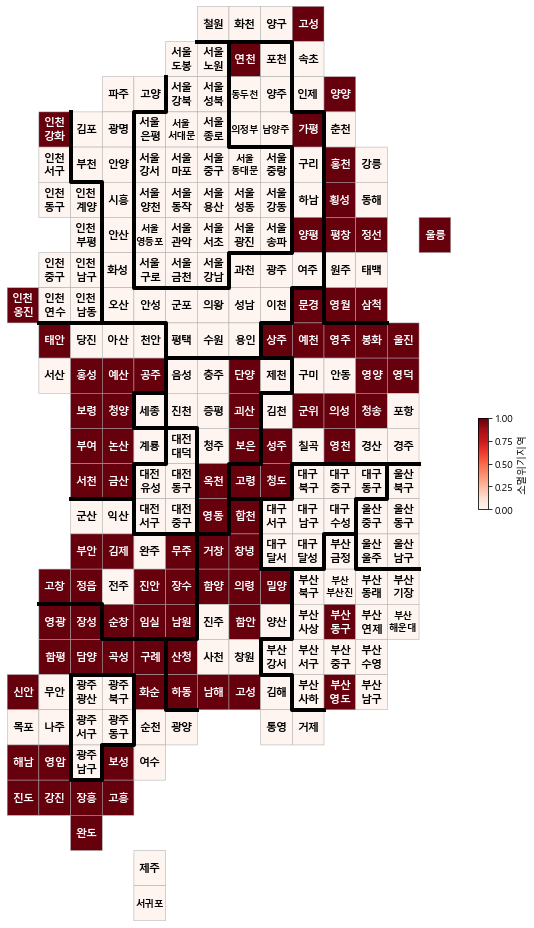

In [273]:
drawKorea('소멸위기지역', pop, '광역시도', '시도', 'Reds')
